In [ ]:
import os
import zipfile
import requests

def download_and_extract(url, output_zip, extract_dir):
    # Download file
    if not os.path.exists(output_zip):
        print(f"Downloading dataset to: {output_zip}")
        response = requests.get(url, stream=True)
        with open(output_zip, "wb") as file:
            for chunk in response.iter_content(chunk_size=1024):
                file.write(chunk)
        print("Download completed!")
    else:
        print("Dataset already exists, skipping download!")

    # Extract file
    if not os.path.exists(extract_dir):
        print(f"Extracting to: {extract_dir}")
        with zipfile.ZipFile(output_zip, "r") as zip_ref:
            zip_ref.extractall(extract_dir)
        print("Extraction completed!")
    else:
        print("Files already extracted, skipping extraction!")

# Download and extract the low-resolution (LR) image dataset
# http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_unknown_X2.zip
lr_url = "http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X2.zip"
lr_zip = "./DIV2K_train_LR_bicubic_X2.zip"
lr_dir = "./DIV2K_train_LR_bicubic_X2"

download_and_extract(lr_url, lr_zip, lr_dir)

Download completed!
Extracting to: ./DIV2K_train_LR_bicubic_X2
Extraction completed!


In [ ]:
# Install necessary dependencies
!git clone https://github.com/xinntao/Real-ESRGAN.git
!pip install -r Real-ESRGAN/requirements.txt

In [ ]:
# Download pretrained models for Real-ESRGAN
!wget https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth -P Real-ESRGAN/weights
!wget https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.2.4/RealESRGAN_x4plus_anime_6B.pth -P Real-ESRGAN/weights

In [ ]:
import os
import shutil

os.makedirs("Real-ESRGAN/inputs", exist_ok=True)

src_dir = "DIV2K_train_LR_bicubic_X2"
dst_dir = "Real-ESRGAN/inputs"

for file_name in os.listdir(src_dir):
    full_file_name = os.path.join(src_dir, file_name)
    if os.path.isfile(full_file_name):
        shutil.copy(full_file_name, dst_dir)

print("copy finished")


copy finished


In [ ]:
import torch

print("PyTorch version:", torch.__version__)
print("Is CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("CUDA version:", torch.version.cuda)
    print("Device Name:", torch.cuda.get_device_name(0))

PyTorch version: 2.5.1+cu121
Is CUDA available: True
CUDA version: 12.1
Device Name: NVIDIA A100-SXM4-40GB


In [ ]:
!pip install realesrgan


In [ ]:
import os
import cv2
import glob
from tqdm import tqdm
from basicsr.archs.rrdbnet_arch import RRDBNet
from basicsr.utils.download_util import load_file_from_url
from realesrgan import RealESRGANer
from realesrgan.archs.srvgg_arch import SRVGGNetCompact

# Configure paths
input_folder = 'Real-ESRGAN/inputs'  # Folder containing input images
output_folder = 'Real-ESRGAN/results'  # Folder for saving output images
weights_folder = 'Real-ESRGAN/weights'  # Folder to store model weights

# Ensure output and weights folders exist
os.makedirs(output_folder, exist_ok=True)
os.makedirs(weights_folder, exist_ok=True)

# Configure model
model_name = 'RealESRGAN_x4plus'
model_urls = {
    'RealESRGAN_x4plus': 'https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth',
    'RealESRNet_x4plus': 'https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.1/RealESRNet_x4plus.pth',
    'RealESRGAN_x4plus_anime_6B': 'https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.2.4/RealESRGAN_x4plus_anime_6B.pth'
}

# Load the selected model
if model_name == 'RealESRGAN_x4plus':
    model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=23, num_grow_ch=32, scale=4)
    netscale = 4
elif model_name == 'RealESRNet_x4plus':
    model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=23, num_grow_ch=32, scale=4)
    netscale = 4
elif model_name == 'RealESRGAN_x4plus_anime_6B':
    model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=6, num_grow_ch=32, scale=4)
    netscale = 4
else:
    raise ValueError(f"Unsupported model: {model_name}")

# Download weights if not already present
model_path = os.path.join(weights_folder, f'{model_name}.pth')
if not os.path.exists(model_path):
    print(f"Downloading weights for {model_name}...")
    load_file_from_url(model_urls[model_name], model_dir=weights_folder)

# Initialize the upsampler
upsampler = RealESRGANer(
    scale=netscale,
    model_path=model_path,
    model=model,
    tile=0,  # No tiling
    tile_pad=10,
    pre_pad=0,
    half=True  # Use FP16 inference
)

# Check the input folder
if os.path.isfile(input_folder):
    paths = [input_folder]
else:
    paths = sorted(glob.glob(os.path.join(input_folder, '*')))

# Inference and save results
for idx, path in enumerate(tqdm(paths, desc="Processing images", unit="image")):
    print(path)
    imgname, extension = os.path.splitext(os.path.basename(path))
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)

    if img is None:
        print(f"Skipping invalid image: {path}")
        continue

    img_mode = 'RGBA' if len(img.shape) == 3 and img.shape[2] == 4 else None

    try:
        output, _ = upsampler.enhance(img, outscale=4)
    except RuntimeError as error:
        print(f"Error processing {path}: {error}")
        continue

    # Save the output image
    extension = extension[1:] if img_mode != 'RGBA' else 'png'
    save_path = os.path.join(output_folder, f'{imgname}_output.{extension}')
    cv2.imwrite(save_path, output)

print(f"Results saved in '{output_folder}'")


/usr/local/lib/python3.10/dist-packages/realesrgan/utils.py:63: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loadnet = torch.load(model_path, map_location=torch.device('cpu

Real-ESRGAN/inputs/00003.png


Processing images:  10%|█         | 1/10 [00:01<00:12,  1.35s/image]

Real-ESRGAN/inputs/00017_gray.png


Processing images:  30%|███       | 3/10 [00:01<00:03,  2.27image/s]

Real-ESRGAN/inputs/0014.jpg
Real-ESRGAN/inputs/0030.jpg


Processing images:  50%|█████     | 5/10 [00:01<00:01,  4.06image/s]

Real-ESRGAN/inputs/ADE_val_00000114.jpg
Real-ESRGAN/inputs/OST_009.png


Processing images:  60%|██████    | 6/10 [00:02<00:01,  2.70image/s]

Real-ESRGAN/inputs/children-alpha.png


Processing images:  70%|███████   | 7/10 [00:03<00:01,  1.99image/s]

Real-ESRGAN/inputs/tree_alpha_16bit.png
	Input is a 16-bit image


Processing images: 100%|██████████| 10/10 [00:03<00:00,  2.54image/s]

Real-ESRGAN/inputs/video
Skipping invalid image: Real-ESRGAN/inputs/video
Real-ESRGAN/inputs/wolf_gray.jpg
Results saved in 'Real-ESRGAN/results'


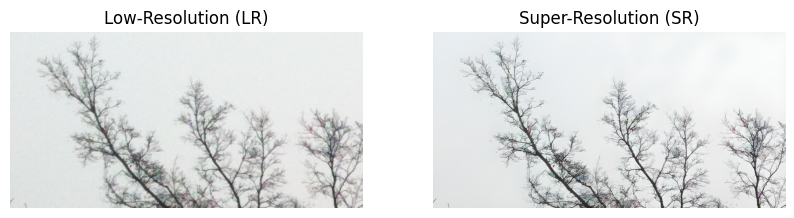

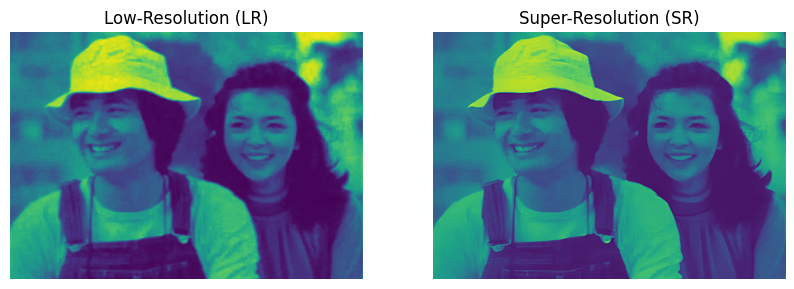

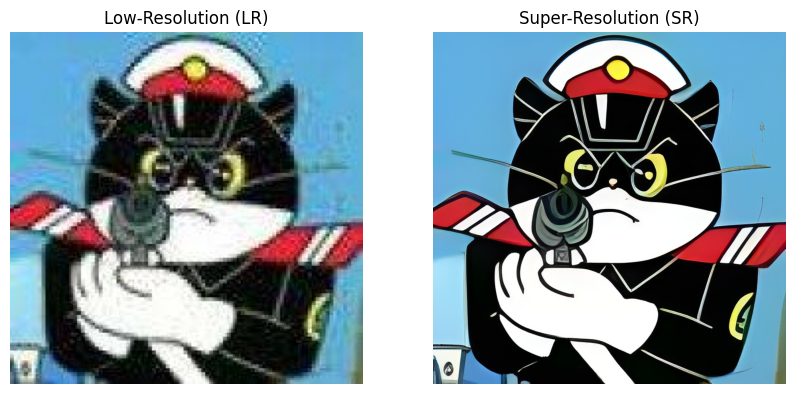

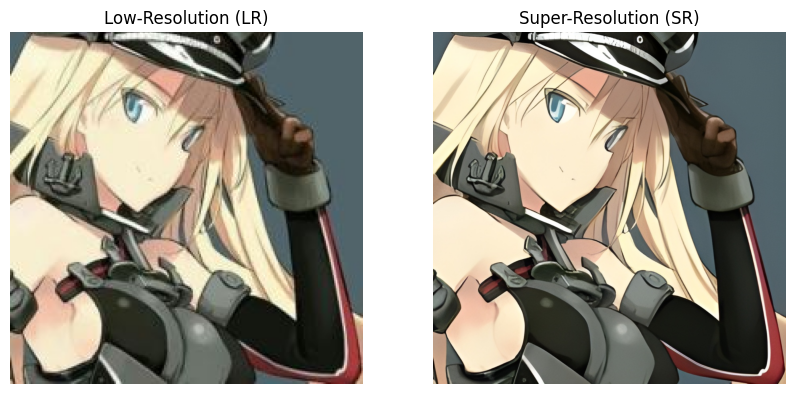

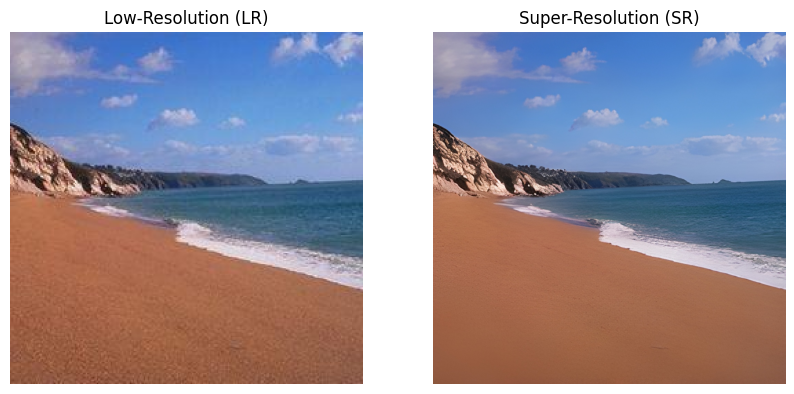

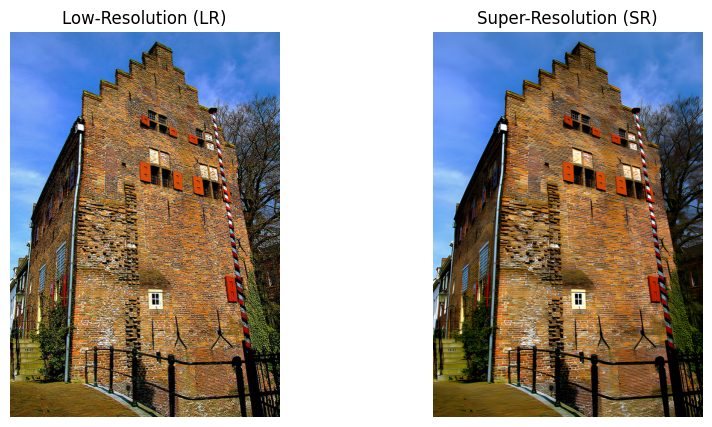

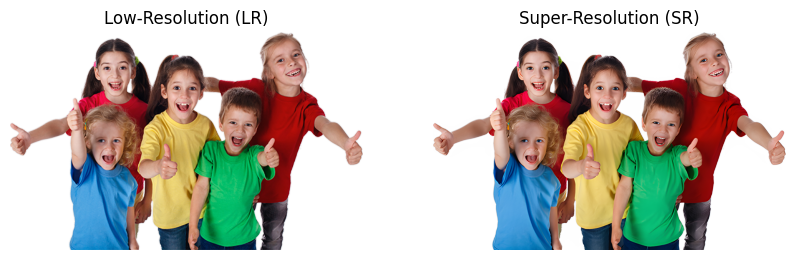

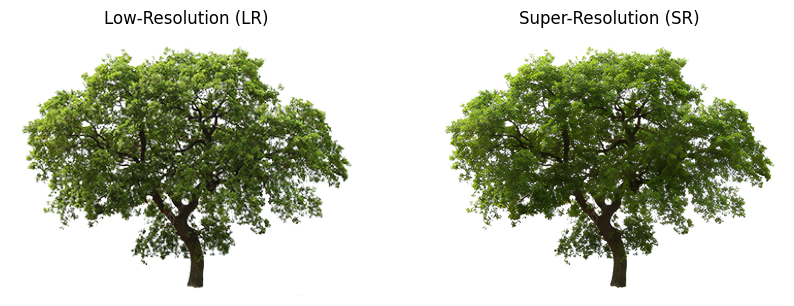

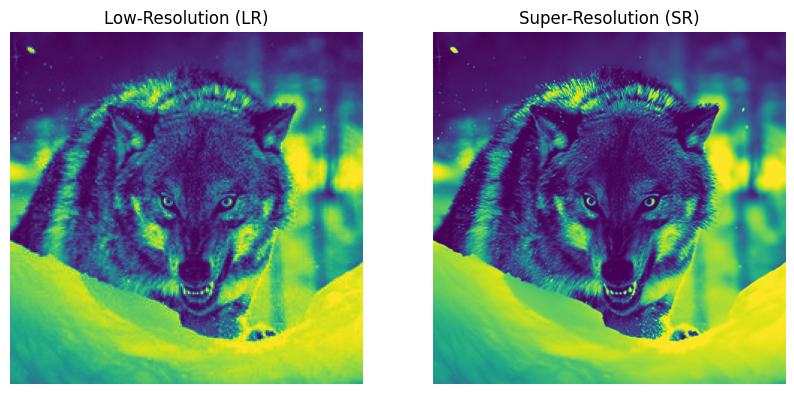

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

input_dir = './Real-ESRGAN/inputs'
result_dir = './Real-ESRGAN/results'

input_images = [f for f in sorted(os.listdir(input_dir)) if os.path.isfile(os.path.join(input_dir, f))]
result_images = [f for f in sorted(os.listdir(result_dir)) if os.path.isfile(os.path.join(result_dir, f))]


for inp, res in zip(input_images, result_images):
    input_image = Image.open(os.path.join(input_dir, inp))
    result_image = Image.open(os.path.join(result_dir, res))

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Low-Resolution (LR)")
    plt.imshow(input_image)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Super-Resolution (SR)")
    plt.imshow(result_image)
    plt.axis('off')

    plt.show()

## LoRA Fine Tuning

In [ ]:
import os
import zipfile
import gdown
from google.colab import drive

# Step 1: Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:


# Define paths
drive_dir = "/content/drive/MyDrive"  # Path in Google Drive
extract_dir = os.path.join(drive_dir, "training")


# CelebA-HQ Google Drive link (direct download link with ID)
# dataset_url = "https://drive.google.com/uc?id=1badu11NqxGf6qM3PTTooQDJvQbejgbTv"

# Download and extract

In [ ]:
import torch
torch.cuda.empty_cache()


In [ ]:
!git clone https://github.com/xinntao/ESRGAN.git


Cloning into 'ESRGAN'...
remote: Enumerating objects: 225, done.
remote: Counting objects: 100% (225/225), done.
remote: Compressing objects: 100% (131/131), done.
remote: Total 225 (delta 87), reused 217 (delta 84), pack-reused 0 (from 0)
Receiving objects: 100% (225/225), 24.86 MiB | 11.25 MiB/s, done.
Resolving deltas: 100% (87/87), done.


In [ ]:
import functools
import torch
import torch.nn as nn
import torch.nn.functional as F
from ESRGAN.RRDBNet_arch import RRDBNet
class RRDBNet_8x(RRDBNet):
    def __init__(self, in_nc, out_nc, nf, nb, gc=32):
        super().__init__(in_nc, out_nc, nf, nb, gc)
        self.upconv3 = nn.Conv2d(nf, nf, 3, 1, 1, bias=True)

    def forward(self, x):
        fea = self.conv_first(x)
        trunk = self.trunk_conv(self.RRDB_trunk(fea))
        fea = fea + trunk

        # 8x upscaling with three upsampling steps
        fea = self.lrelu(self.upconv1(F.interpolate(fea, scale_factor=2, mode='nearest')))
        fea = self.lrelu(self.upconv2(F.interpolate(fea, scale_factor=2, mode='nearest')))
        fea = self.lrelu(self.upconv3(F.interpolate(fea, scale_factor=2, mode='nearest')))
        out = self.conv_last(self.lrelu(self.HRconv(fea)))
        return out


In [ ]:
from torchvision.models import vgg16
# Define Perceptual Loss
class PerceptualLoss(nn.Module):
    def __init__(self):
        super(PerceptualLoss, self).__init__()
        vgg = vgg16(pretrained=True).features[:16].eval()
        for param in vgg.parameters():
            param.requires_grad = False
        self.vgg = vgg
        self.mse_loss = nn.MSELoss()

    def forward(self, x, y):
        x_features = self.vgg(x)
        y_features = self.vgg(y)
        return self.mse_loss(x_features, y_features)

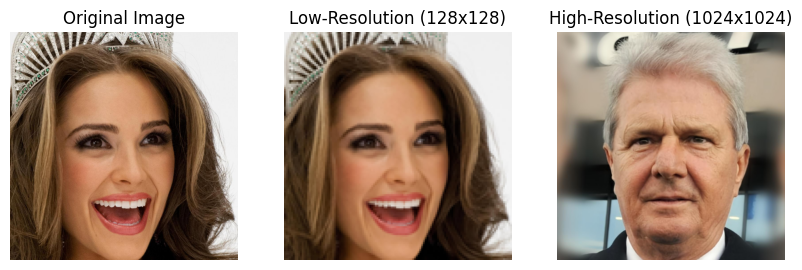

<ipython-input-53-20c47ec94b56>:71: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pretrained_weights = torch.load(weights_path)
/usr/local/lib/python3.10/dist-packages/torch

Loaded pretrained weights.
LoRA configuration applied.


Epoch 1/5:   1%|          | 50/5001 [00:10<17:29,  4.72it/s]


KeyboardInterrupt: 

In [ ]:
import os
import cv2
import glob
import requests
from tqdm import tqdm
from peft import LoraConfig, get_peft_model
import torch.quantization
from basicsr.archs.rrdbnet_arch import RRDBNet
from realesrgan import RealESRGANer
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import ToTensor, Resize
import torch
from PIL import Image
import zipfile
import gdown
from torch.optim.lr_scheduler import StepLR

# Define Dataset Class
class CelebA_HQ_Dataset(Dataset):
    def __init__(self, root_dir, hr_size=1024, lr_size=128):
        self.img_paths = sorted(glob.glob(os.path.join(root_dir, "*.jpg")))
        if len(self.img_paths) == 0:
            raise ValueError(f"No images found in directory: {root_dir}")

        self.hr_transform = Resize((hr_size, hr_size), Image.BICUBIC)
        self.lr_transform = Resize((lr_size, lr_size), Image.BICUBIC)
        # Display the two images side by side
        plt.figure(figsize=(10, 5))

        # Original Image (for reference)
        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        plt.imshow(self.hr_transform(Image.open(self.img_paths[0])))
        plt.axis("off")

        # Low-Resolution Image
        plt.subplot(1, 3, 2)
        plt.title(f"Low-Resolution ({lr_size}x{lr_size})")
        plt.imshow(self.lr_transform(Image.open(self.img_paths[0])))
        plt.axis("off")

        # High-Resolution Image
        plt.subplot(1, 3, 3)
        plt.title(f"High-Resolution ({hr_size}x{hr_size})")
        plt.imshow(hr_image)
        plt.axis("off")

        plt.show()
        self.to_tensor = ToTensor()

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img = Image.open(self.img_paths[idx]).convert("RGB")
        hr_img = self.hr_transform(img)
        lr_img = self.lr_transform(hr_img)
        return self.to_tensor(lr_img), self.to_tensor(hr_img)


# Initialize Dataset and DataLoader
dataset = CelebA_HQ_Dataset(extract_dir, hr_size=1024, lr_size=128)
exit()
dataloader = DataLoader(dataset, batch_size=2, shuffle=True, num_workers=4)

# Initialize Model
model = RRDBNet_8x(in_nc=3, out_nc=3, nf=64, nb=23, gc=32)

# Load Pretrained Weights
weights_path = "/content/Real-ESRGAN/weights/RealESRGAN_x4plus.pth"
pretrained_weights = torch.load(weights_path)
model_dict = model.state_dict()
pretrained_weights = {k: v for k, v in pretrained_weights.items() if k in model_dict}
model_dict.update(pretrained_weights)
model.load_state_dict(model_dict, strict=False)
print("Loaded pretrained weights.")

# Apply LoRA
config = LoraConfig(
    r=8,
    lora_alpha=32,
    target_modules=["upconv1", "upconv2", "upconv3", "HRconv"],  # Apply LoRA to these layers
    lora_dropout=0.1,
    task_type="SUPER_RESOLUTION"
)

model = get_peft_model(model, config)  # Wrap the model with LoRA
print("LoRA configuration applied.")

# Move model to device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Loss Functions
mse_loss = nn.MSELoss()
perceptual_loss = PerceptualLoss().to(device)

# Optimizer and Scheduler
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = StepLR(optimizer, step_size=5, gamma=0.5)  # Reduce LR every 5 epochs

# Training Loop
epochs = 5
for epoch in range(epochs):
    model.train()
    epoch_loss = 0
    for lr_imgs, hr_imgs in tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}"):
        lr_imgs, hr_imgs = lr_imgs.to(device), hr_imgs.to(device)

        optimizer.zero_grad()
        output_imgs = model(lr_imgs)

        # Combine MSE and Perceptual Loss
        loss = mse_loss(output_imgs, hr_imgs) + 0.01 * perceptual_loss(output_imgs, hr_imgs)
        loss.backward()

        # Gradient clipping for stability
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()
        epoch_loss += loss.item()

    scheduler.step()
    print(f"Epoch [{epoch+1}/{epochs}] Loss: {epoch_loss / len(dataloader):.4f}")

# Save Fine-Tuned LoRA Model
os.makedirs("output", exist_ok=True)
torch.save(model.state_dict(), "output/RRDBNet_8x_lora_finetuned.pth")
print("LoRA fine-tuned model saved.")




Randomly selected images: ['24151.jpg', '24123.jpg', '24141.jpg', '24171.jpg', '24142.jpg', '24157.jpg', '24095.jpg', '24091.jpg', '24190.jpg', '24192.jpg']
Processing: /content/drive/MyDrive/testing/24151.jpg


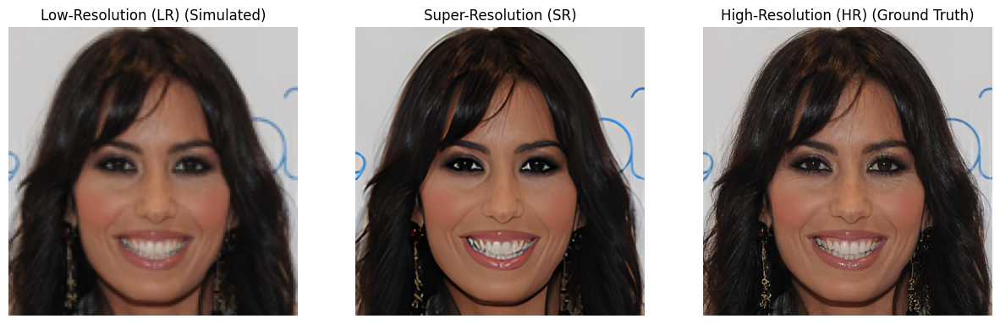

Processing: /content/drive/MyDrive/testing/24123.jpg


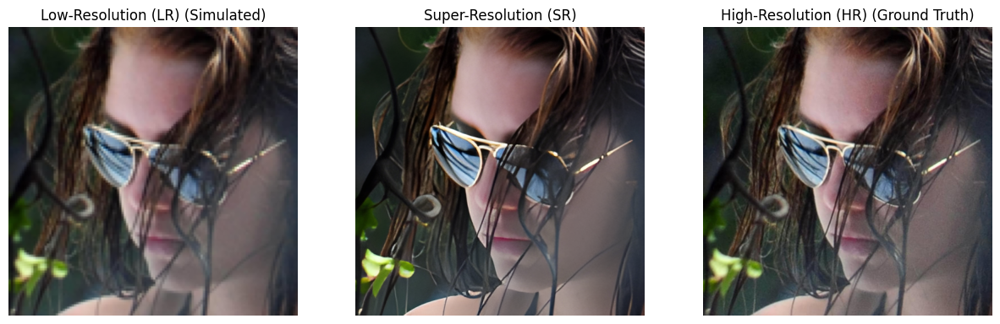

Processing: /content/drive/MyDrive/testing/24141.jpg


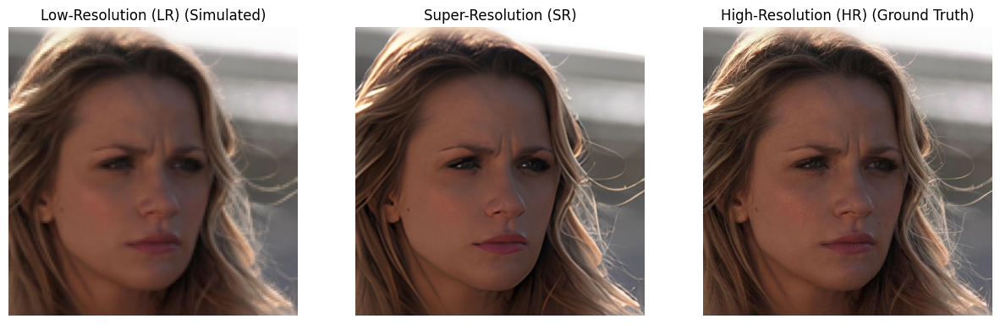

Processing: /content/drive/MyDrive/testing/24171.jpg


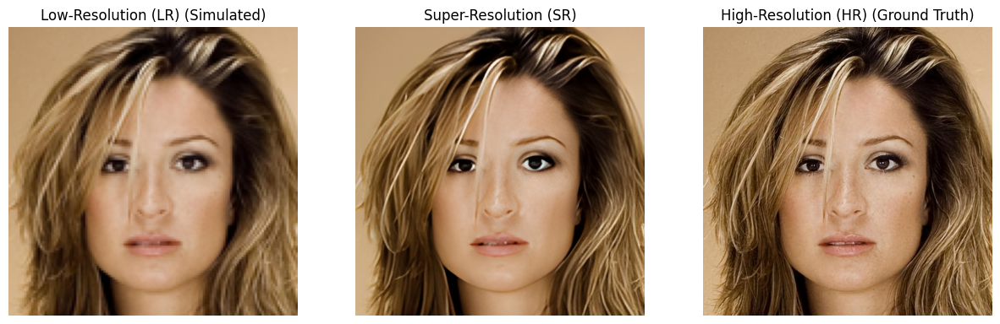

Processing: /content/drive/MyDrive/testing/24142.jpg


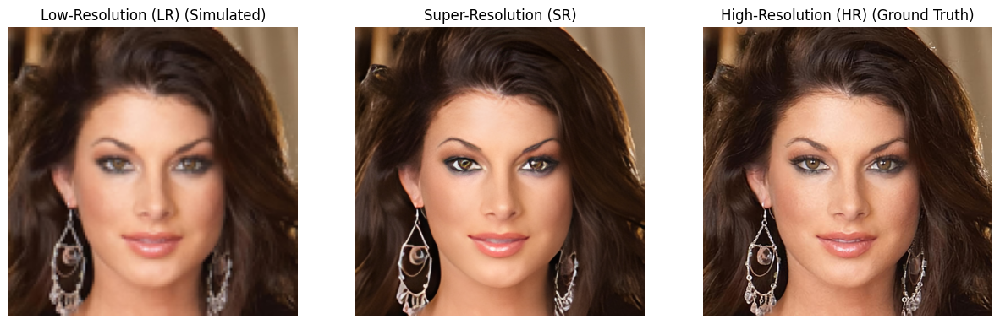

Processing: /content/drive/MyDrive/testing/24157.jpg


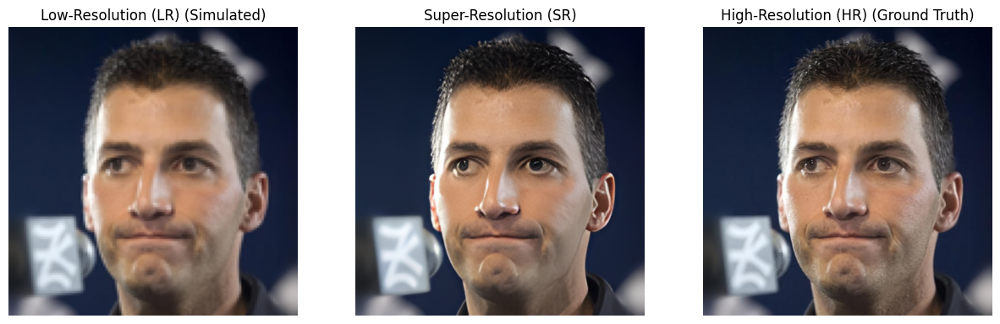

Processing: /content/drive/MyDrive/testing/24095.jpg


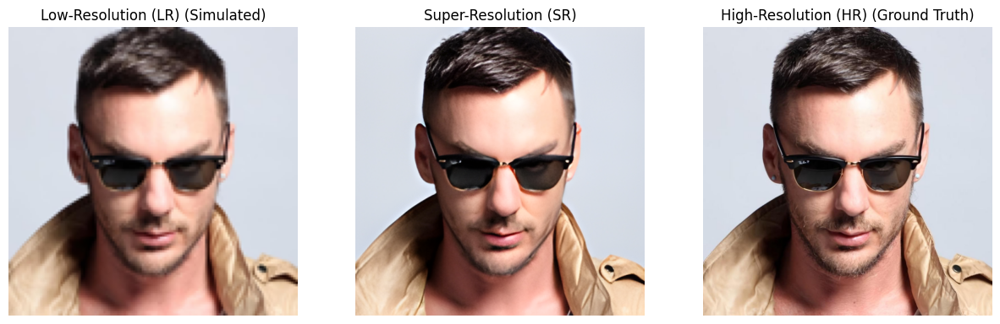

Processing: /content/drive/MyDrive/testing/24091.jpg


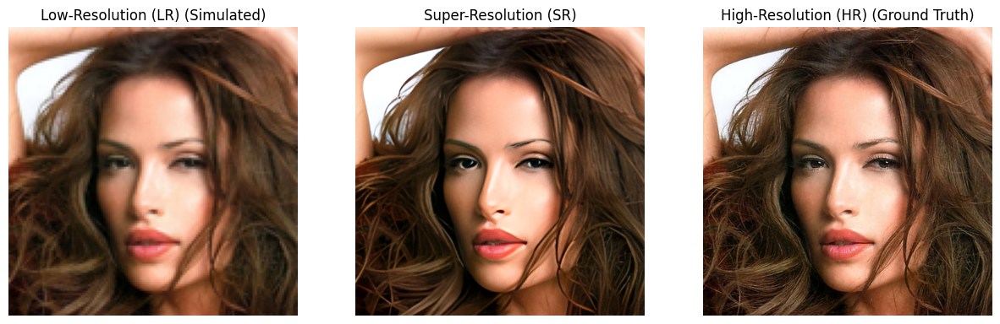

Processing: /content/drive/MyDrive/testing/24190.jpg


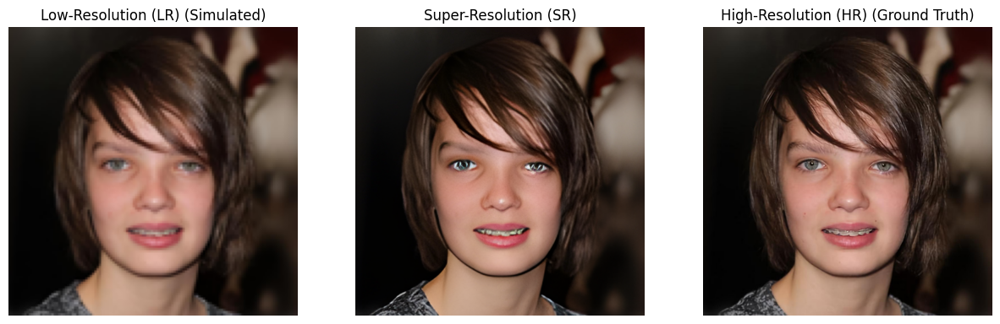

Processing: /content/drive/MyDrive/testing/24192.jpg


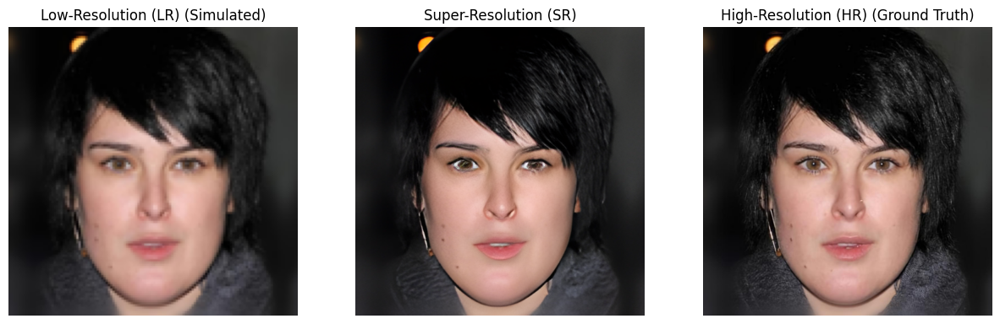

Super-resolution results saved to '/content/drive/MyDrive/testing_results'.


In [ ]:
import os
import random
import torch
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_tensor, to_pil_image

# Paths
model_path = "/content/output/RRDBNet_8x_lora_finetuned.pth"  # Path to your fine-tuned model
input_folder = "/content/drive/MyDrive/testing"  # Folder containing input images
output_folder = "/content/drive/MyDrive/testing_results"
os.makedirs(output_folder, exist_ok=True)

# Step 1: Load Fine-Tuned Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = RRDBNet_8x(in_nc=3, out_nc=3, nf=64, nb=23, gc=32).to(device)
model.load_state_dict(torch.load(model_path, map_location=device), strict=False)
model.eval()
print("Loaded fine-tuned model.")

# Step 2: Randomly Select 10 Images
all_images = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.png'))]
random_images = random.sample(all_images, 10)
print(f"Randomly selected images: {random_images}")

# Step 3: Function for Super-Resolution
def perform_super_resolution(image_path, model, scale=8):
    """Perform super-resolution on a single image."""
    img = Image.open(image_path).convert("RGB")
    lr_image = img.resize((img.width // scale, img.height // scale), Image.BICUBIC)  # Simulate LR
    lr_tensor = to_tensor(lr_image).unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        sr_tensor = model(lr_tensor)  # Model prediction
        sr_tensor = torch.clamp(sr_tensor, 0, 1)  # Ensure values are within [0, 1] range

    # Convert tensors to PIL images
    sr_image = to_pil_image(sr_tensor.squeeze(0).cpu())
    return lr_image, sr_image

# Step 4: Process and Display Images
for idx, img_name in enumerate(random_images):
    img_path = os.path.join(input_folder, img_name)
    print(f"Processing: {img_path}")

    # Perform SR and get LR, SR images
    lr_image, sr_image = perform_super_resolution(img_path, model, scale=8)
    hr_image = Image.open(img_path).convert("RGB")  # Load HR for ground truth

    # Save SR image
    sr_save_path = os.path.join(output_folder, f"sr_output_{idx + 1}.png")
    sr_image.save(sr_save_path)

    # Display Side by Side
    plt.figure(figsize=(15, 5))

    # Simulated Low-Resolution (LR) Image
    plt.subplot(1, 3, 1)
    plt.title("Low-Resolution (LR) (Simulated)")
    plt.imshow(lr_image)
    plt.axis("off")

    # Super-Resolution (SR) Image
    plt.subplot(1, 3, 2)
    plt.title("Super-Resolution (SR)")
    plt.imshow(sr_image)
    plt.axis("off")

    # High-Resolution (HR) Image
    plt.subplot(1, 3, 3)
    plt.title("High-Resolution (HR) (Ground Truth)")
    plt.imshow(hr_image)
    plt.axis("off")

    plt.show()

print(f"Super-resolution results saved to '{output_folder}'.")
